<div style="direction:rtl;line-height:300%;">
	<font face="XB Zar" size=5>
		<div align=center>
			<font face="IranNastaliq" size=30>
				<p></p>
				<p></p>
به نام خدا
				<p></p>
			</font>
			<font color=#FF7500>
دانشگاه صنعتی شریف - دانشکده مهندسی کامپیوتر
            </font>
			<p></p>
			<font color=blue>
سیگنال‌ها و سیستم‌ها - جناب آقای دکتر منظوری شلمانی
            </font>
			<br />
			<br />
نیمسال دوم 00-99
		</div>
		<hr/>
		<div align=center>
		    <font color=red size=6>
			    <br />
تمرین پنجم
            	<br/>
			</font>
نام و نام خانوادگی: امیرمهدی نامجو
			<br/><br/>
شماره دانشجویی: 97107212
                <br/>
        </style>
	</font>
</div>

<div style="direction:rtl">
ابتدا کتابخانه‌های مورد نیاز را ایمپورت می‌:کنیم.
</div>

In [272]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from IPython.display import Audio
from scipy.fft import fft , fftfreq , ifft, fftshift
from scipy.signal import resample


## Q1

### A

<div style="direction:rtl">
ابتدا داده های مد نظر را لود کرده و مطابق با نرخ نمونه گیری تعیین شده و براساس مدت زمان داده، از آن دوباره نمونه گیری می‌کنیم. همچنین تبدیل فوریه آن‌ها را هم محاسبه می‌کنیم.
</div>

In [273]:
new_sample_rate = 88200
sample_rate1, raw1= wavfile.read("music1.wav")
sample_rate2, raw2= wavfile.read("music2.wav")
data1 = resample(np.float64(raw1) , round(len(raw1)*new_sample_rate/sample_rate1))
data2 = resample(np.float64(raw2) , round(len(raw2)*new_sample_rate/sample_rate2))
freq1 = (fft(data1))
freq2 = (fft(data2))



<div style="direction:rtl">
تابع مربوط به fftshift را روی تبدیل فوریه اعمال کرده و معکوس آن را هم بدست میاوریم.
</div>

In [274]:
freq1_shift = fftshift(freq1)
data1_shift = (ifft(freq1_shift))

<div style="direction:rtl">
نمودار مربوط به داده‌ها قبل و بعد از fftshift را رسم می‌کنیم.
</div>

C:\Users\titansarus\AppData\Roaming\Python\Python39\site-packages\numpy\core\_asarray.py:102: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
C:\Users\titansarus\AppData\Roaming\Python\Python39\site-packages\numpy\core\_asarray.py:102: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
C:\Users\titansarus\AppData\Roaming\Python\Python39\site-packages\numpy\core\_asarray.py:102: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
C:\Users\TITANS~1\AppData\Local\Temp/ipykernel_20092/2544678233.py:17: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


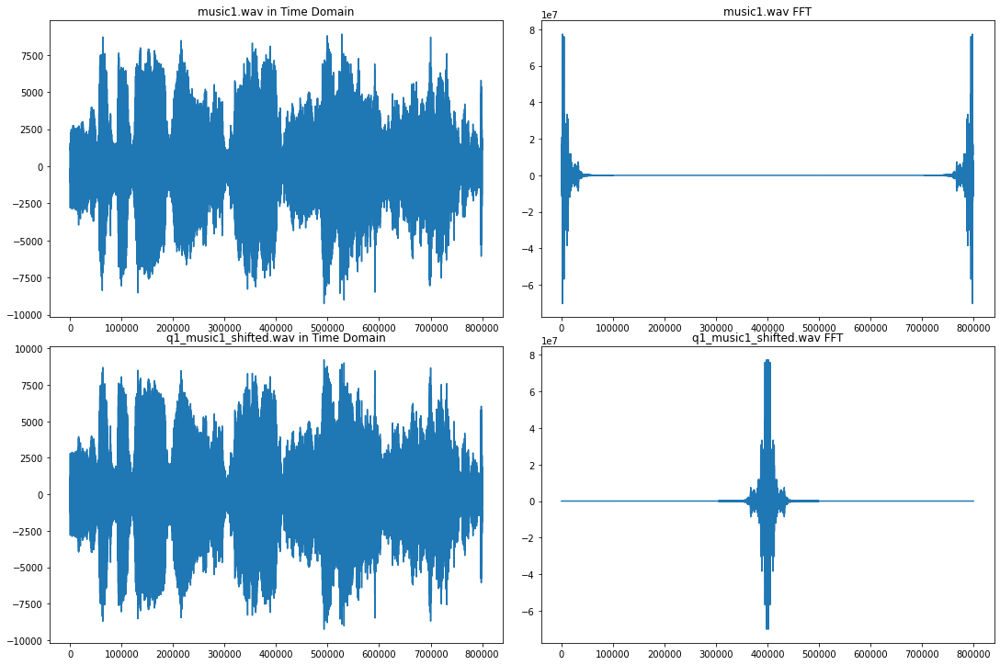

In [275]:

fig , axes = plt.subplots(nrows=2,ncols=2 , figsize = (15,10))
fig.tight_layout()
axes[0,0].plot(data1)
axes[0,0].set_title("music1.wav in Time Domain")


axes[0,1].plot(freq1)
axes[0,1].set_title("music1.wav FFT")


axes[1,0].plot(data1_shift)
axes[1,0].set_title("q1_music1_shifted.wav in Time Domain")

axes[1,1].plot(freq1_shift)
axes[1,1].set_title("q1_music1_shifted.wav FFT")

fig.show()

<div style="direction:rtl">
مشاهده می‌کنیم که در حالت اول قبل از شیفت پیدا کردن یک نیمه تبدیل فوریه در انتها و نیمه دیگر در انتها است. اما بعد از fftshift آن نیمه دوم به ابتدای نیمه اول اضافه شده است. به بیان دیگر، تابع fftshift مبدا را به روی فرکانس ۰ آورده است. توجه کنید که عملا به دلیل تقارن موجود نسبت به محور x=0 اگر یک سمت محور را داشته باشیم، سمت دیگر را هم خواهیم داشت. تابع fft رایج کتابخانه ها این نیمه دوم را در انتهای محور قرار می دهد در حالی که در اصل تقارن حول ۰ وجود داشته است.
</div>

<div style="direction:rtl">
با نوشتن داده‌ها روی فای، مشاهده می‌کنیم که صدایی شنیده نمی‌شود.
</div>

In [276]:
wavfile.write("q1_music1_shifted.wav",new_sample_rate,data1_shift.astype(np.int16))

C:\Users\TITANS~1\AppData\Local\Temp/ipykernel_20092/1798827987.py:1: ComplexWarning: Casting complex values to real discards the imaginary part
  wavfile.write("q1_music1_shifted.wav",new_sample_rate,data1_shift.astype(np.int16))


In [277]:
Audio("q1_music1_shifted.wav")

<div style="direction:rtl">
مشاهده می‌کنیم که صدایی شنیده نمی‌شود. برای درک علت این موضوع، به مقادیر زمانی دو سیگنال نگاهی می‌اندازیم:
</div>

In [278]:
print(data1)
print(data1_shift)

[1090.         1168.95071871 1310.04811894 ... 1432.29915138 1238.00509803
 1112.22929929]
[ 1090.        +1.07102096e-13j -1168.95071871-2.82398105e-14j
  1310.04811894+3.71942406e-13j ... -1432.29915138-1.34525810e-13j
  1238.00509803+5.24223583e-13j -1112.22929929-5.65335000e-13j]


<div style="direction:rtl">
فارغ از وجود عوامل مختلط در دومی که عملا بسیار کوچک هستند و اثرگذار نیستند، نکته قابل توجه این است که مقادیر در حالت شیفت‌یافته، یکی در میان مثبت و منفی هستند. در اصل هم محور کردن فرکانس‌ها حول صفر باعث این موضوع شده است. این موضوع در شکل خیلی واضح نیست چون عملا سرعت نوسان ها را بالا برده است. در حالی که در فرمت داده شده، انتظار شکل دیگری از داده‌ها را داریم. این موضوع عملا باعث می‌شود که صدایی پخش نشود. 
</div>

### B

In [279]:
part_b_freq = freq2+freq1_shift
part_b_data = (ifft(part_b_freq))


In [280]:
wavfile.write("q1_music_part_b.wav",new_sample_rate,part_b_data.astype(np.int16))

C:\Users\TITANS~1\AppData\Local\Temp/ipykernel_20092/1178846097.py:1: ComplexWarning: Casting complex values to real discards the imaginary part
  wavfile.write("q1_music_part_b.wav",new_sample_rate,part_b_data.astype(np.int16))


In [281]:
Audio("q1_music_part_b.wav")

<div style="direction:rtl">
صدای موسیقی دوم (موسیقی کلاسیک) پخش می‌شود. عملا موسیقی اول با توجه به شیفتی که پیدا کرده و بالا هم مشاهده کردیم پخش نمی‌شود ولی موسیقی دوم به همان شکلی که بوده دوباره بازیابی می‌شود و پخش می‌شود.
</div>

### C

<div style="direction:rtl">
این بار موسیقی اول (مرغ سحر) پخش می‌شود و موسیقی دوم پخش نمی‌شود. در اصل با شیفت فرکانسی دوم، موسیقی اول به همان حالت اول خود در می‌آید. (چون عملا بار دیگر نیمه دوم به ابتدای نیمه اول اضافه می‌شود و دو بار تکرار این عملا معادل این است که هیچ تغییری ایجاد نکنیم) ولی موسیقی دوم یک بار شیفت فرکانسی خورده و مانند وضعیتی می شود که در بخش قبل برای موسیقی اول پیش آمده بود. در نتیجه در این قسمت موسیقی اول پخش می‌شود. دلیل این که می‌توانیم این دو را عملا مستقل از هم بررسی کنیم هم خطی بودن تبدیل فوریه و حوزه فرکانس است. عملا یعنی این شیفت فرکانسی دوم، باعث شده که موسیقی دوم شیفت فرکانسی بخورد و موسیقی اول هم که در این سیگنال قبلا شیفت فرکانسی خورده بود، با شیفت فرکانسی دوم احیا بشود.
</div>

In [282]:
part_c_freq = fftshift(part_b_freq)
part_c_data = ifft(part_c_freq)


In [283]:
wavfile.write("q1_music_part_c.wav",new_sample_rate,part_c_data.astype(np.int16))

C:\Users\TITANS~1\AppData\Local\Temp/ipykernel_20092/3947621404.py:1: ComplexWarning: Casting complex values to real discards the imaginary part
  wavfile.write("q1_music_part_c.wav",new_sample_rate,part_c_data.astype(np.int16))


In [284]:
Audio("q1_music_part_c.wav")

### Q2

<div style="direction:rtl">
در قسمت الف بخش قبل سیگنال را در زمان هم بررسی کردیم و دیدیم که عملا این شیفت فرکانسی باعث می‌شود که یکی در میان داده‌های موجود علامت خود را عوض کنند. یعنی مثلا داده‌هایی که شماره اندیس آن‌ها (با شروع از صفر) فرد بوده است، منفی مقار قبلی خود بشوند. در نتیجه می‌توانیم این شیفت فرکانسی را در حوزه زمان به صورت زیر تعریف کنیم. بدین شکل مشابه بخش قبل را ولی با تابعی که در حوزه زمان کار می‌کند پیاده‌سازی می‌کنیم و نتایج هم کاملا مشابه است.
</div>

In [285]:
def freqshift_time (arr):
    arr2 = np.copy(arr)
    arr2[1:len(arr2):2] = -arr2[1:len(arr2):2]
    return arr2


In [286]:
data1_shift_q2 = freqshift_time(data1)

In [287]:
wavfile.write("q2_music1_shifted.wav",new_sample_rate,data1_shift_q2.astype(np.int16))

In [288]:
Audio("q2_music1_shifted.wav")

In [289]:
data_mixed_q2 = data1_shift_q2 + data2

In [290]:
wavfile.write("q2_music_part_b.wav",new_sample_rate,data_mixed_q2.astype(np.int16))

In [291]:
Audio("q2_music_part_b.wav")

In [294]:
data_mixed_another_shift_q2 = freqshift_time(data_mixed_q2)
wavfile.write("q2_music_part_c.wav",new_sample_rate,data_mixed_another_shift_q2.astype(np.int16))

In [295]:
Audio("q2_music_part_c.wav")

### Q3

In [304]:
new_sample_rate = 23000
sr_c1, clean_1= wavfile.read("clean1.wav")
sr_d1, distorted_1= wavfile.read("distorted1.wav")
sr_d2, distorted_2= wavfile.read("distorted2.wav")



In [305]:
f_clean1 =  resample(np.fft.fft(clean_1),new_sample_rate)
f_dist1 =  resample(np.fft.fft(distorted_1),new_sample_rate)
f_dist2 =  resample(np.fft.fft(distorted_2),new_sample_rate)

H = f_dist1 / f_clean1

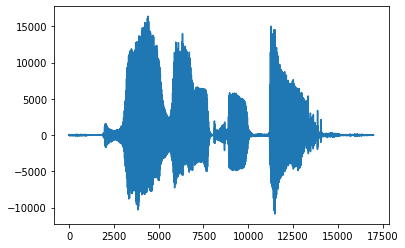

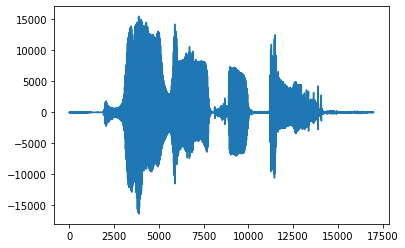

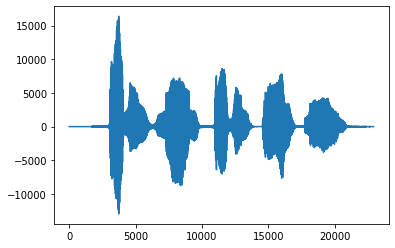

C:\Users\titansarus\AppData\Roaming\Python\Python39\site-packages\numpy\core\_asarray.py:102: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


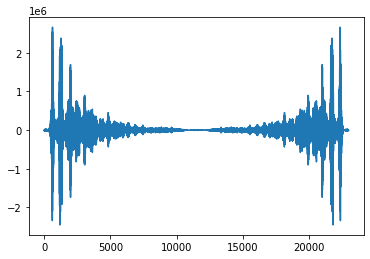

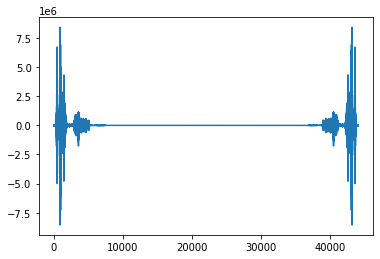

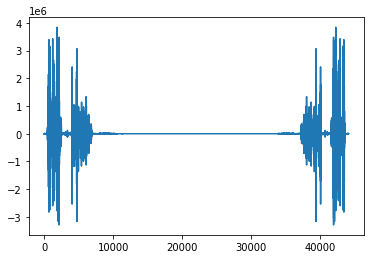

In [306]:
plt.plot(clean_1)
plt.show()
plt.plot(distorted_1)
plt.show()
plt.plot(distorted_2)
plt.show()

plt.plot(f_clean1)
plt.show()
plt.plot(f_distorted1)
plt.show()
plt.plot(f_distorted2)
plt.show()



In [308]:

f_clean2 = f_dist2/H

data_clean2 = (np.fft.ifft((f_clean2)))



In [317]:
wavfile.write("clean2.wav",sr_d2,data_clean2.astype("int16"))

C:\Users\TITANS~1\AppData\Local\Temp/ipykernel_20092/2778383485.py:1: ComplexWarning: Casting complex values to real discards the imaginary part
  wavfile.write("clean2.wav",sr_d2,data_clean2.astype("int16"))


In [318]:
Audio("clean2.wav")

### Q4

<div style="direction:rtl">
برای این سوال بعد از خواندن داده‌ها، نمودار طیف فرکانسی آن را رسم می‌کنیم تا ببینیم که چه فرکانس‌های دامنه بالایی دارند. از آن‌ جایی که نویز احتمالا به صورت تصادفی (مثلا نویز سفید گاوسی) باش، در همه فرکانس‌های اثر یکسانی خواهد گذاشت. در نتیجه باید فرکانس‌های اصلی که بیش‌ترین دامنه را دارند بدست بیاوریم. این فرکانس‌ها مربوط به سیگنال اصلی هستند. بقیه را با فیلتر حذف می‌کنیم.
</div>

In [320]:

sr_noisy, noisy_data= wavfile.read("noisy1.wav")

In [321]:
fft_spectrum = (np.abs(np.fft.rfft(noisy_data[:])))
leng = len(fft_spectrum)
f = (sr_noisy/2) * np.linspace(0,1,leng)
fft_spectrum = fft_spectrum[:np.size(f)]

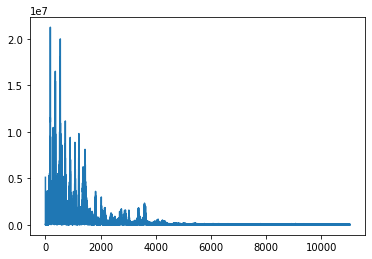

In [323]:
plt.plot(f,fft_spectrum)
plt.show()

<div style="direction:rtl">
    از حوالی ۱۵۰ تا نزدیک ۲۰۰۰ دامنه زیاد است. با تکه کد زیر اولین جایی که به حدود
    0.5e7
    رسیده و آخرین جایی که به 
    0.5e7
    رسیده را بدست می‌آوریم.
</div>

In [328]:
first , last = None , None
for i in range(1,len(fft_spectrum)):
    if (fft_spectrum[i]>0.5e7):
        if first == None:
            first = f[i]
        last = f[i]
print(first , last)

130.64625 1447.7478750000002


<div style="direction:rtl">
    فیلتر bandpass برای بازه فرکانسی بین ۱۳۰ تا ۱۵۰۰ هرتز طراحی می‌کنیم.
    
    برای طراحی از فیلتر butterworth استفاده می‌کنیم. بعد از چند بار تست، درجه ۴ و درجه ۵ خروجی خوبی دادند. همچنین 
    خود کتابخانه scipy پیشنهاد داده است که نوع خروجی در حالت sos به معنی
    second-order sections
    باشد که عملا فیلتر مرتبه بالاتر را از کنار هم قرار دادن اجزای مرتبه دو ایجاد می‌کند. سپس با کمک تابع sosfilt این فیلتر را روی داده اعمال می‌کنیم.
    
    همچنین باید توجه کرد که واحد فرکانس بحرانی‌ای که scipy می‌گیرد برحسب فرکانس نمونه‌برداری است. به نوعی هر واحد که به آن داده می شود معادل ۲ نیم سیکل در هر نمونه است. در نتیجه در ابتدا مقادیر فرکانسی گفته شده در ۲ (به خاطر رابطه نایکوئیست) ضرب شده و سپس بر نرخ نمونه برداری تقسیم می‌شوند و سپس به تابع مورد نظر داده می‌شوند.
</div>

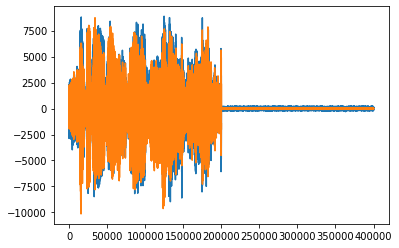

In [329]:
wc = np.array([130,1500])*2/sr_noisy
B,A = signal.butter(5,wc,btype='bandpass')
filtered = signal.filtfilt(B,A , noisy_data)
sos = signal.butter(4,wc,btype='bandpass',output="sos")
filtered=signal.sosfilt(sos,noisy_data)

plt.plot(noisy_data)
plt.plot(filtered)

In [333]:
wavfile.write("denoise1.wav" , sr_noisy,filtered.astype(np.int16))

In [334]:
Audio("denoise1.wav")

<div style="direction:rtl">
  خروجی نهایی به صورت بالاست. مشاهده می‌کنیم که نویز تقریبا حذف شده است. خصوصا در نیمه دوم فایل صوتی که نویز را به طور جداگانه و بدون صدای اصلی داشتیم، اکنون صدای خاصی شنیده نمی‌شود.
</div>